## Data Fundamentals (H)
# Week 1: Numerical Basics
## Numerical arrays and vectorized computation
----
 ##### DF(H) - University of Glasgow - John Williamson - 2019/2020
 
$$\newcommand{\vec}[1]{ {\bf #1}} 
\newcommand{\real}{\mathbb{R}}
\newcommand{\expect}[1]{\mathbb{E}[#1]}
\DeclareMathOperator*{\argmin}{arg\,min}
\vec{x}
\real$$


# Moodle quiz: open during lecture only

---

# Summary
By the end of this unit you should know:

## 1: Why use arrays
* what vectorized computation is
* what numerical arrays are and what they are useful for
* the general categories of array operations
* how images and sounds map onto arrays

## 2: Typing and shapes of arrays
* the naming of different types of arrays (vector, matrix, tensor)
* what shape and dtype are
* what axes of an array are and how they are named (row, column, etc.)

## Creating, indexing, slicing, joining and rotating
* creating new arrays
* slicing and indexing operations and their syntax
* how to rotate, flip and transpose arrays
* how to split and join arrays and the rules governing this
* boolean arrays and fancy indexing

## 4: Arithmetic, broadcasting and aggregation
* scalar and elementwise arithmetic on arrays
* broadcasting rules
* basic aggregation operations like summation, mean, cumulative sum
* sorting and selection like argmax, argsort, find


---

In [ ]:
import IPython.display
IPython.display.HTML("""
<script>
  function code_toggle() {
    if (code_shown){
      $('div.input').hide('500');
      $('#toggleButton').val('Show Code')
    } else {
      $('div.input').show('500');
      $('#toggleButton').val('Hide Code')
    }
    code_shown = !code_shown
  }

  $( document ).ready(function(){
    code_shown=false;
    $('div.input').hide()
  });
</script>
<form action="javascript:code_toggle()"><input type="submit" id="toggleButton" value="Show Code"></form>""")

In [2]:
# various imports we will need
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

import jhwutils.image_audio as image_audio
from jhwutils.image_audio import (
    play_sound,
    show_image,
    load_image_colour,
    load_image_gray,
    show_image_mpl,
    load_sound,
    play_sound,
)
from jhwutils.matrices import show_boxed_tensor_latex, print_matrix

%matplotlib inline
plt.rc("figure", figsize=(14.0, 7.0))

c:\local\conda3\lib\site-packages\dask\config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}
c:\local\conda3\lib\site-packages\IPython\kernel\__init__.py:13: ShimWarning: The `IPython.kernel` package has been deprecated since IPython 4.0.You should import from ipykernel or jupyter_client instead.
  "You should import from ipykernel or jupyter_client instead.", ShimWarning)


----

# Example: retro graphics
You have a screenshot of a retro game you've just built:
<img src="imgs/dungeon_0.gif">

*.[Image](https://opengameart.org/content/dawnlike-16x16-universal-rogue-like-tileset-v181) by DragonDePlatino, [CC-BY-SA 3.0](http://creativecommons.org/licenses/by-sa/3.0/).*


But it looks too sharp and clean. You want to give it a *retro* look and feel, like it's being played on an old-school monochrome CRT. There are obviously ways of doing this with image editors like Photoshop or GIMP. But how would you do this programmatically? How are effects like these even implemented?

A small number of primitive operations on  **arrays** let us do sophisticated operations in a just few lines of code.

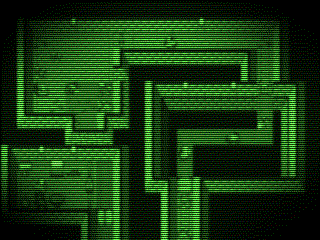

In [12]:
img = load_image_colour("imgs/Dungeon_0.gif")

img = np.tile(img[:, ::2, ::2, :], (8, 1, 1, 1))

# project colours to monchrome green
img = np.dot(img, np.outer([0.1, 0.8, 0.1], [0.4, 1, 0.3]) * 0.15)

# apply bleed and inter-frame smear
for i in range(4):
    img[:, :, 1:, :] += img[:, :, :-1, :] * 0.4
    img[:, 1:, :, :] += img[:, :-1, :, :] * 0.4
    img[::2] += 0.05 * img[1::2]

# apply scanline effect
img[:, ::2, :, :] *= 0.25

# apply screen vignette mask
rows, cols = np.linspace(-1, 1, img.shape[1]), np.linspace(-1, 1, img.shape[2])
mask = 1 - (np.outer(np.abs(rows), np.abs(cols))**2)
img = (img.swapaxes(0, -1) * np.tile(mask[:, :, None]**3,
                                     (3, 1, 1, 1))).swapaxes(0, -1)

# show the resulting animation
image_audio.show_gif(img, width="70%")

# Why use arrays?

# ndarray
## Our basic datatype
There are several basic data types you will have encountered in CS so far, including:

* lists (sequence types)
* strings (character sequences)
* dictionaries/hash tables (maps)
* classes/structures (record types)
* trees 


## ndarrays
The fundamental data type for this course is the **multidimensional numerical array** (of floating point numbers). This is a very powerful data type, although simple in structure, there are great many operations that can be done elegantly with an array.

We will call these arrays **ndarrays** (for *n-dimensional arrays*) or sometimes **tensors** (in reference to the mathematical object which generalises vectors and matrices to higher orders), which some people use. 


----
    



# Why use arrays?
### Images, sounds, videos
Numerical arrays sound boring. But they are arguably the most "fun" data structure. Images, sounds, videos are all most easily worked with as arrays of numbers. 
* An *image* is a 2D array of brightness values;
* a *sound* is a 1D array of sound pressure levels; 
* a *video* is a 3D array of brightness values (x, y, and 
time).

And the manipulations that we might want to apply to these kinds of data (e.g. brightening a video, mixing together two sounds, cropping a video, rotating a 3D model) are very straightforward to express in terms of array operations. This leads to compact, elegant code that can be astonishingly efficient.


### Scientific data
Scientific data (e.g. from physics experiments, weather models, even models of how people choose search terms on Google) can often be most conveniently represented as numerical arrays. The kind of operations we want to do to scientific data (e.g. find the weather most similar today in the historical record) are easily expressed as array operations.


### 3D graphics
3D computer graphics, as you would encounter in a game or VR, usually involves manipulating **geometry**. Geometry is typically specified as simple geometric shapes, like triangles. These shapes are made up of points -- **vertices** -- typically with an $[x,y,z]$ location. Operations like moving, rotating, scaling of objects are operations on big arrays of these vertices:

    vec3 player = [
            [x,y,z]
            [x,y,z]
            [x,y,z]
            [x,y,z]
            ...
        ]
    
<img src="imgs/low_poly.jpg">  

Being able to manipulate positions in space efficiently and cleanly is an important tool in making computer graphics programming work.

### Abstraction and elegance
By representing data as a numerical array, we can extend the operations we apply to single numbers (like integers or floating points) to entire arrays of numbers. For example, if we have an array of 100 3D positions `pos`, it would be very nice if we could scale all of the points by a factor of 2 (double in size) and move the whole array 100 units right like this:

    pos = pos * 2 + [100,0,0]
    
This very clearly expresses the operation to be performed. Applying an identical operation to many elements of an array simultaneously is a very useful operation. Code which can express this type of operation without explicit loops is a easier to read and write. Consider the alternative:
    
    new_pos = []
    for x,y,z in pos:
        new_pos.append((2*x+100, 2*y+0, 2*z+0))
    pos = new_pos




### Mathematical power
There is a rich set of mathematical abstractions that work on spaces defined over array-valued elements. For example, **linear algebra** provides tools to work with 1D arrays (*vectors*) and 2D arrays (*matrices*) and can be used to solve many difficult problems. Having these types represented as basic types in a programming language makes working with linear algebraic problems vastly easier.

### Efficiency
Numerical arrays are both **compact** (they store data in a very memory efficient way) and **computationally efficient** (it is possible to write code that manipulates arrays extremely quickly).

<video src="imgs/noaa.mp4" autoplay loop controls width="50%">

*[Image credit: NOAA, Public domain]*

For big, number-focused problems like:
* weather simulation
* image processing
* speech recognition
* machine learning

arrays are the best way we have of solving these problems. 

In big, text-heavy problems with irregular structure, databases are a more natural structure to store and work with data.

#### Deep learning
Some of you may have seen recent advances in *machine learning* involving "deep learning". This has had some major impact in the last five years:

* Redefined state of the art in speech recognition.
* Cutting edge speech synthesis: wavenet
* State of the art image recognition: inceptionnet
* Auto captioning images: image-from-text
* Recognising sentiment from words: word2vec
* Synthesizing images: stackgan

The key to deep learning is to be able to represent data as arrays of numbers and to do **all** computations as array operations. That is we perform operations that act on all elements of an array simultaneously.

### Vectorisation: one operation, many data
The practice of writing code which acts on arrays of values simultaneously is called **vectorised computation**. It is a special case of **parallel** computing, where we restrict ourselves to numerical operations on fixed size arrays. Modern CPUs have numerous **vectorised** instructions to perform the same operation on many numbers at once (e.g. MMX, SSE, SSE2, SSE3 on x86, NEON on ARM, etc.). This is called **Single Instruction Multiple Data**.


#### GPUs
The major importance of vectorised computation is that **graphics processor units** (GPUs) are by far the most powerful computational units in any modern computer or phone; they are essentially supercomputers on a card. They can perform calculation  much more quickly the central processing unit (CPU). 
<img src="imgs/gtx-1070.jpg">

#### GPUs are array processors
**But** they are effectively big groups of very simple processors, which are able to deal very well with data in numerical arrays, but are very slow when working with other data structures. Anything that can be written as an operation on numerical arrays can be done at lightning speed on a GPU. 

In fact, GPUs are basically devices that can do computations on numerical arrays, **and that's it**. To write (efficient) GPU code, you need to write code in terms of numerical arrays.

#### Spreadsheet-like computation

<img src="imgs/spread.png" width="50%">

Array types are much like entire *spreadsheets in a single variable*, which you can perform standard spreadsheet operations on, like: 

* tallying up columns 
* selecting values which have a certain range
* plotting charts
* joining together several sheets 

The abstraction of array types makes it easy to do what are complex operations with a standard spreadsheet. And they work on data beyond just 2D tables.

# Typing and shapes of arrays


In [13]:
from jhwutils.matrices import show_boxed_tensor_latex

## Vector, matrix, tensor
**ndarrays** can have different *dimensions*; sometimes called *ranks*, as in a "*rank-3 tensor*" or "3D array" , meaning an array with rows, columns and channels.

<img src="imgs/ranks.png" width="400px">

#### Vector
We call a 1D array of values a **vector**: for example:

In [14]:
# a vector of length 1
[0]

# a vector of length 3
# (e.g. a position in 3D space)
[1, 2, 3]

# a vector of length 8
[0, 0, 0, 0, 1, 0, 0, 0]

In [15]:
show_boxed_tensor_latex(np.array([0, 1, 2, 3]))

<IPython.core.display.Latex object>

 
#### Matrix
A 2D array of values is called a **matrix**, and is formed of rows and columns:

In [ ]:
# A matrix of dimensions 1x1
[[0]] 

# A matrix of dimensions 2x3 (2 rows 3 columns)
[[1,1,1],
 [1,1,1]]  

# A matrix of dimensions 3x3 (3 rows 3 columns)
[[1,2,3],
 [4,5,6],   
 [7,8,9]]


In [16]:
show_boxed_tensor_latex(np.array([[0, 1, 2, 3], [4, 5, 6, 7], [7, 8, 9, 10]]))

<IPython.core.display.Latex object>

#### Tensors

Any array with more than 2 dimensions is just called an **nD array**  (**n d**imensional array) or sometimes a **tensor**. There isn't a convenient mathematical notation for tensors.

    # a 2 x 3 x 3 tensor
    [[[1,2,3],
      [4,5,6],   
      [7,8,9]],
      
      [10,11,12],
      [13,14,15],   
      [16,17,18]]]

It is often easiest to think of tensors as arrays of matrices or vectors (e.g a 3D tensor is really a stack of 2D matrices, a 4D arrays is a grid of 2D matrices, a 5D array is a stack of those grids, etc.)

    # a 2 x 2 x 3 x 3 tensor 
    #notice how it is really a 2x2 array,
    # with each element being a 3x3 subarray
        [[[[ 1  2  3]     [[[19 20 21] 
           [ 4  5  6]       [22 23 24]
           [ 7  8  9]]      [25 26 27]]

          [[10 11 12]      [[28 29 30]         
           [13 14 15]       [31 32 33]
           [16 17 18]]]     [34 35 36]]]]
           
We typically don't encounter tensors with more than 6 dimensions, as these would require enormous amounts of memory to store and don't correspond to many real-world use cases. 

In [17]:
show_boxed_tensor_latex(np.arange(24).reshape(2,3,4))                                

<IPython.core.display.Latex object>

In [18]:
show_boxed_tensor_latex(np.arange(36).reshape(2,2,3,3))    

<IPython.core.display.Latex object>

## Axes
We often refer to specific dimensions as **axes** or **dimensions**. For example a matrix (a 2D array) has two axes: **rows** (axis 0) and **columns** (axis 1). A vector has just one axis, axis 0. 
A 4D tensor has 4 axes, which are indexed 0, 1, 2, 3.

Many operations we can do can be selectively applied only on certain axes, which is a very useful way to specify the effect of an operation.


# Array operations
Unlike most of the data structures you are familiar with (lists, dictionaries, strings), there are **many** operations defined on arrays. Some of these are convenience operations, but there are many
fundamental operations as well. These include:


## Array operations

There are many operations defined on arrays. These generalise ideas we have seen on sequence types to sequences across multiple dimensions. This means we can do things like slicing or summing elements, but over *independent dimensions*. These operations will also be very *very* fast, and memory efficient.

The most important classes of operations that we will cover are:

* **Slice**: slice out rectangular regions, for reading or writing.
    * Chop out second to tenth rows of a 2D matrix: `x[1:9, :]`
    * Set the second column to 0 `x[:,1] = 0`
* **Filter**: find values matching criteria.
    * select elements of x where x is negative `x[x<0]`
* **Reduce**: aggregate across dimensions.
    * compute sum of each column;  `np.sum(x, axis=0)`
* **Map**: apply functions or arithmetic operations elementwise
    * add 1 to every element of x `x+1` 
    * add x and y `x+y` 
    * take the sine of every element of x `np.sin(x)`
* **Concatenate and repeat**:
    * stick x and y together one on top of the other; np.concatenate([x,y], axis=0)
    * repeat x 8 times across the columns; np.tile(x, [1,8])
* **Generate**:
    * create arrays of all zeros: `np.full((8,8),0)`
    * create "counting" arrays: `np.arange(10)`
    * load arrays from files or save them to disk.
* **Reorder**
    * reverse/flip axes
    * sort axes
    * exchange rows/columns (transpose)
    
### No explicit iteration

<img src="imgs/nofor.png" width="30%">

We operate on arrays without writing explicit iterations over their elements wherever possible. This has two effects:

* The code is **much simpler**. Adding two arrays of numbers with `c=a+b` is simpler than:

        for i in range(n):
            for j in range(m):
                c[i][j] = a[i][j] + b[i][j]
                
* The code is **much faster**. The operations can be run in accelerated routines, or with hardware acceleration, e.g. on the GPU.
    

## Vectors and matrices
As well as being convenient to implement in silicon, arrays correspond to rich mathematical objects.
### Geometry of vectors
1D arrays can be used to represent vectors, and vectors have a mathematical structure. This structure of vectors is essential in modeling physical systems, building information retrieval systems, machine learning and 3D rendering. Vectors have length, direction; they can be added, subtracted, scaled; various products are defined on vectors. Arrays are often used to represent vectors; for example a 2D array might be used to store a sequence of vectors (perhaps positions in space), which could be operated on simultaneously.

We write a vector a bold letter lower case symbol: $\bf x$ (other notations include an arrow or bar above an upper case symbol).

### Signal arrays
1D arrays can also be used to represent **signals**; that is sequences of measurements over time. Signals include images, sounds, and other time series. Signals can be scaled, mixed, chopped up and rearranged, filtered, and processed in many other ways.

The use of arrays to represent sequences and vectors is not exclusive; some operations use both representations simultaneously. We typically write a signal as $x[t]$.


### Algebra of matrices
2D arrays are matrices, which have an algebra: **linear algebra**. A matrix represents a **linear map**, a particular kind of function which operates on vectors (in **vector space**), and the operation of the function is completely defined by the elements of that matrix. 

Linear algebra is extremely rich can is used to perform many essential computations. For example, almost all of 3D rendering involves matrix operations (e.g. coordinate transformation). It has many interesting features; multiplication is defined such that it **applies** the map when multiplying with vectors and **composes** the map when multiplying with other matrices. 

We write a matrix as an upper case symbol $A$. 
    
### Mathematical operations
We consequently have specialised mathematical operations we can apply to arrays
* **Vector operations**: operations which apply geometric effects to vectors: dot product, cross product, norm
    * for example, getting the Euclidean length of a vector
* **Matrix operations**: linear algebra operations like multiplication, transpose, inverse, matrix exponentials, decompositions
    * for example, multiplying together two 3D transformation matrices
* **Signal processing operations**: signal processing relevant operations like convolution, Fourier transform, numerical gradients, cumulative summation
    * for example, blurring an image using a convolution

------     
## Statically typed, rectangular arrays: **ndarrays**

**ndarrays** (n-dimensional arrays) represent sequences. However, arrays are not like lists. 

They have

* **fixed, predefined** size (or "shape")
* **fixed, predefined** type (all elements have the same type)
* they can only hold numbers (typically integers or floating-point)
* they are inherently multidimensional
* they are required to be "rectangular" -- a 2D array must have the same number of columns in each row, for example.

Valid array:

    1,0,0   # each row has three elements
    0,1,0
    0,0,1
    
Invalid array:

    1,0,0,0,0   # 5 elements
    0,1         # 2 elements
    0,0,1       # 3 elements
    
* The type of an array has to be specified very precisely; for example, we have to specify the precision of floating point numbers if we use floats (usually the options are 32 or 64 bits).

* Arrays cannot (usually) be extended or resized after they have been created. To have the effect of changing the size of an array, we must create a new array with the right size and copy in (a portion of) the old elements.

* Arrays **are** typically mutable though, and the values they hold can be changed after creation. So we can write new values into an existing array.

### Why do we have to type arrays?

If you are familiar with Python, you'll be surprised (possibly) that arrays have to have specified types; Python is dynamically typed and doesn't require types to be specified. 

But the elements *within* the array are **not** Python values. They are stored as a block of "raw numbers", with some information that tells us things like the dimensions of the array, and the type of the elements. The entire array is one *single* value, which through some clever syntax, *looks* as if it is made up of individual (Python values). We can access and change the values *as if* they were Python values, but internally they are quite different.



#### Reasons for typing
**ndrrays** are a fairly  thin wrapper around raw blocks of memory. This is what makes them compact and efficient.

Because of this restriction on typing, numerical arrays are **much** more efficiently packed into memory, and operations on them can be performed **extremely** quickly (several orders of magnitude faster than plain Python).

The same is true for other platforms and languages: numerical arrays are normally implemented to be the fastest and smallest possible structure for representing blocks of numbers.


In [19]:
import numpy as np

# convert to arrays
a_array = np.arange(10000000.0)
b_array = np.arange(10000000.0)
a_list = list(a_array)
b_list = list(b_array)

In [20]:
%%timeit
# %%timeit just times how long it takes to run some code, by repeating it many times and 
# taking the average
global a
for i in range(len(a_list)):
        a_list[i] += 2 * b_list[i]

3.73 s ± 11.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [21]:
%%timeit
global a_array
# shorter to write as well!
a_array += 2 * b_array

26.6 ms ± 323 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


-----


# Practical array manipulation
## NumPy

We will be using Python with some additional modules (sometimes called the Python "Scientific Stack"). In particular, we will use **NumPy** which provides fast array operations, **SciPy** which provides a range of scientific functionality (e.g. statistics) and **Matplotlib** which provides plotting and visualisation functionality.

**NumPy** is the core package in this set. It provides a very comprehensive set of array types and operations, and is the basis of many other Python packages (e.g. for image processing, games libraries, simulation packages, scientific graphics).

It has very high performance routines for computations (based on optimized Fortran+C code) and an easy to use API.
#### Other languages
Many other languages have numerical libraries which support similar functionality to NumPy, either as built-in features (e.g. Matlab, R, APL, Julia) or as external libraries (e.g. Eigen for C++, MKL for C, ND4J for Java, LAPACK/BLAS for Fortran). There's even a cool array system for Javascript for deep learning called DeepLearnJS (https://pair-code.github.io/deeplearnjs/) which can leverage the GPU to do array operations efficiently *in the browser*.

While we will use NumPy throughout this course (mainly because it is by far the easiest to use option!), the fundamental ideas generalise outside of the Python ecosystem (e.g. DeepLearnJS is based on NumPy). The operations we will see are standard operations on arrays, and aren't special to NumPy.

We usually import it like this:





In [22]:
# np is the conventional name for numpy
import numpy as np

## Shape and dtype
Every array is characterised by two things:
* the type of its elements: the **dtype** (e.g.` float64`)
* its **shape**: that is, its dimensions. For example, 32x8

### Order
We always discuss the shape of arrays in the order
* rows
* columns
* depth/frames/channels/planes/...

**This ordering is important: remember it!**

So a 2x3 array means 2 rows, 3 columns:
$$\begin{bmatrix}
0 & 0 & 0 \\
0 & 0 & 0
\end{bmatrix}$$

A 3x2 array means 3 rows, 2 columns:
$$\begin{bmatrix}
0 & 0  \\
0 & 0  \\
0 & 0  \\
\end{bmatrix}$$


A 32x8 array has 32 rows of 8 columns each. It has 256 elements (`32*8=256`) in total.

### Indexing and axes
We index from **0**, so element [0,1] of an array means *first row, second column*.

The **dimensions** of an array are often called its **axes**. Do not confuse this with axes or dimension of a vector space! The number of dimensions of an array is sometimes called its **rank** (this is distinct from the concept of *rank* in linear algebra, if you are familiar with this). 

* A scalar is a rank 0 tensor
* A vector is a rank 1  tensor (1 dimensional array)
* A matrix is a rank 2 tensor (2 dimensional array)
* A stack of matrices is a rank 3 tensor (3 dimensional array)
* and so on...


## Dtypes
**dtype** just stands for the *d*ata *type*, and it is the data type of every element in an array (what kind of number it is). For the moment, we will assume we get floating point elements in our arrays: we'll discuss this in more detail later. Every element has the same *dtype*; it applies to the whole array.

Common *dtypes* are:
* `float64` double-precision float numbers
* `float32` single-precision float numbers
* `int32` signed 32 bit integers
* `uint8` unsigned 8 bit integers

though there are many more.


We can interrogate an array to see its *shape* and *dtype*:

## Images and sounds
Images and sounds are classic examples of arrays. They are naturally manipulated using array abstractions.
For example, we can load an image from disk, and its `shape` will be its resolution:

Shape: (296, 400), dtype: 'float64'


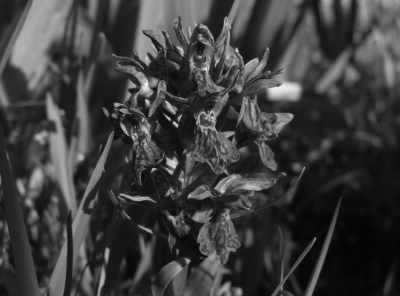

In [23]:
from jhwutils.image_audio import load_image_gray, load_image_colour, show_image, load_sound, play_sound

def print_array(x):
    print("Shape: {shape}, dtype: '{dtype}'".format(shape=x.shape, dtype=x.dtype))
    
## Simple grayscale image
img = load_image_gray("imgs/orchid.png")
print_array(img)
show_image(img, width="50%")

In [25]:
## Audio example
snd = load_sound("sounds/guitar.wav")
print_array(snd)

# we can work out how many seconds duration the sound will be by the shape of the array
# if we know the sampling rate (here, it's 44.1Khz)
print(("Duration will be: {secs:.2f} seconds ".format(secs=snd.shape[0] / 44100.0)))
play_sound(snd)

Shape: (223344,), dtype: 'float64'
Duration will be: 5.06 seconds 


### Tabular Data
Many other data can be naturally thought of as arrays. For example, a very common structure is a spreadsheet like arrangement of data in tables, with rows and columns.
Each row is an **observation**, and each column is a **variable**.

For example, there is monthly historical data of the sunspot activity for the last ~250 years. It is in a format:

    index    year     sunspots
    1        1749.0    58
    2        1749.08   62.6
    3        1749.17   70.0
    
    ...
    
  
    


In [26]:
# this just turns off scientific notation, so the output looks sensible!
np.set_printoptions(suppress=True) 

# load and print
sunspots = np.loadtxt("data/sunspots.csv", delimiter=',')
print_array(sunspots)
print(sunspots)


Shape: (2820, 3), dtype: 'float64'
[[   1.         1749.           58.        ]
 [   2.         1749.08333333   62.6       ]
 [   3.         1749.16666667   70.        ]
 ...
 [2818.         1983.75         55.8       ]
 [2819.         1983.83333334   33.3       ]
 [2820.         1983.91666667   33.4       ]]


As we will see in detail later, we can for example plot this data array in one go:

Text(0, 0.5, 'No. of sunspots')

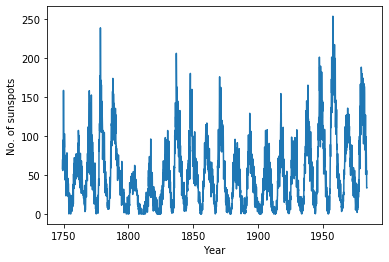

In [27]:
import matplotlib.pyplot as plt
%matplotlib inline 

fig = plt.figure()
ax = fig.add_subplot(1,1,1)

ax.plot(sunspots[:,1], sunspots[:,2])
ax.set_xlabel("Year")
ax.set_ylabel("No. of sunspots")

Text(0, 0.5, 'Amplitude (normalised)')

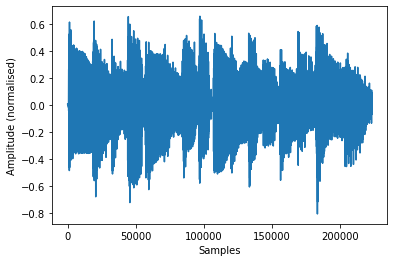

In [28]:
fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.plot(snd)
ax.set_xlabel("Samples")
ax.set_ylabel("Amplitude (normalised)")

# Array ops: creation, indexing, slicing, joining and rotating


---

## Creating arrays
### Converting and copying: np.array
New arrays can be created in several ways:

* Converted from another sequence type, like a list: `np.array()` does this.
* Created blank and filled with some value.  This is often essential in creating temporary variables, for example to accumulate results into.
* Filled with random values.
* Loaded from disk.

`np.array()` takes a sequence and converts it into an array; this can be, for example, a list.
It works for multidimensional arrays as well, given nested sequences. 

## Mutability and copying
`np.array()` can take any sequence, including another ndarray. So it can be used to copy arrays:

This is important, because NumPy arrays are **mutable**, and if several variables refer to the **same** array, the effects might not be what you expect:

In [29]:
x = np.array([1,2,3])
z = x
x[0] = 0
print(x)
print(z) # huh?

[0 2 3]
[0 2 3]


We need to explicitly copy arrays if we want to work on a new array:

In [30]:
x = np.array([1,2,3])
y = np.array(x) # copy
z = x.copy() # same thing as using np.array(x)
x[0] = 0
print(x) # 0 2 3
print(y) # still 1 2 3
print(z)

[0 2 3]
[1 2 3]
[1 2 3]


### Ragged arrays (bad!)
What happens if we **don't** follow the rectangular array rule?

In [31]:
# This **looks** like it works, but it doesn't do what we want
bad_array = np.array([
                [1.0, 2.0, 3.0, 6.0, 7.0],
                [0.0, 0.5, 0.0],  # ragged!
                [5.0, 0.0, 10.0]
               ])
print(bad_array)

# uh oh, it's not an array of numbers
print((bad_array.dtype))

# it's a 3 element array of lists (not very useful)
print((bad_array.shape))

[list([1.0, 2.0, 3.0, 6.0, 7.0]) list([0.0, 0.5, 0.0])
 list([5.0, 0.0, 10.0])]
object
(3,)


In general, *never* create ragged arrays. Always make sure you are creating rectangular arrays!

In [ ]:
# Blank arrays

There are a number of methods all of which do essentially the same thing; allocate a new array with a given shape, and possibly fill it with a value.

* `np.empty(shape)`, which allocates memory for an array, but does not initialise it
* `np.zeros(shape)`,  which initialises all elements to 0
* `np.ones(shape)`,  which initialises all elements to 1
* `np.full(shape, value)` which initialises all elements to `value`

These are just calling `np.empty(shape)` to create a new array and then filling it with a given value.

For example, `x = np.ones((5,8))` is exactly the same as:

In [38]:
x = np.empty((15,4))
x

array([[0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.]])

In [35]:
np.ones((5,8))

array([[1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1.]])

### Blank like
Similarly, we can create blank arrays with the same shape and dtype as an existing array using the `_like` variants. `y = np.zeros_like(x)` is exactly the same as:

    y = np.empty(x.shape, dtype=x.dtype)
    y[:] = 0.0
    
### Random arrays
    

We can also generate random numbers to fill arrays. Many algorithms use arrays of
random numbers as their basic "fuel". 

* `np.random.randint(a,b,shape)` creates an array with uniform random *integers* between a and (excluding) b
* `np.random.uniform(a,b,shape)` creates an array with uniform random *floating point* numbers between a and b
* `np.random.normal(mean,std,shape)` creates an array with normally distributed random floating point numbers between with the given mean and standard deviation.


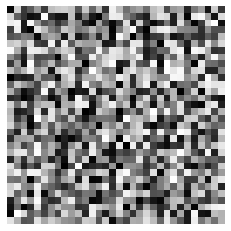

In [39]:
# a 32x32 block of random numbers
show_image_mpl(np.random.uniform(0, 1, (32, 32)))

# Ranges

## arange
We can create a vector of increasing values using `arange` (**a**rray **range**), which works like the built in Python function `range` does, but returns an 1D array (a vector) instead of a list.

`np.arange()` takes one to three parameters:
* `np.arange(end)`  -- returns a vector of numbers 0..end-1
* `np.arange(start, end)`  -- returns a vector of numbers start..end-1
*  `np.arange(start, end, step)` --returns a vector of numbers start..end-1, incrementing by step (which may be **negative** and/or **fractional**!)


In [40]:
np.arange(10)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [41]:
np.arange(5,10)

array([5, 6, 7, 8, 9])

In [42]:
np.arange(0, 10, 2)

array([0, 2, 4, 6, 8])

### Linspace
`np.arange` is useful for generating evenly spaced values, but it is parameterised in a form that can be awkward. 

`np.linspace(start, stop, steps)` is a much easier to use alternative. `linspace` stands for "**lin**early **space**d", and it generates `steps` values between `start` and `stop` **inclusive**. 

In [45]:
np.linspace(1,10,10) # careful -- end is inclusive, so we need 11 steps if we want integer spacing

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.])

In [46]:
# show a gradient, using linspace to generate an array, and then duplicate it onto 20 rows
show_image(np.tile(np.linspace(0,1,100), (20,1)))

### Loading and saving arrays
I/O with arrays is a critical part of any numerical computation system. There are a huge number of ways to store and recall arrays, including:
* simple text formats like CSV (comma separated values)
* binary formats for storing single or multiple arrays like mat and npz
* specialised scientific data formats like HDF5 (often used for huge datasets)
* domain-specific formats like images (png, jpg, etc.), sounds (wav, mp3, etc.), 3D geometry (obj, ...)

#### Text files
*  `np.loadtxt(fname)` and 
* `np.savetxt(arr, fname)` 

work on simple text files.

In [49]:
# this just turns off scientific notation, so the output looks sensible!
np.set_printoptions(suppress=True) 

# load and print, in a single array
sunspots = np.loadtxt("data/sunspots.csv", delimiter=',')
print(sunspots)

np.savetxt("data/sunspots_out.csv", sunspots, )

[[   1.         1749.           58.        ]
 [   2.         1749.08333333   62.6       ]
 [   3.         1749.16666667   70.        ]
 ...
 [2818.         1983.75         55.8       ]
 [2819.         1983.83333334   33.3       ]
 [2820.         1983.91666667   33.4       ]]


---------------

# Slicing and indexing arrays
Arrays can be indexed like lists or sequences (in Python, this uses square brackets []), but arrays can have **multidimensional** indices. These are indices which are really tuples of values.

This means we write the variable, with the index in square brackets, where the index might have comma separated values. Indices start at **zero**!

In [50]:
x = np.arange(10)
x[0] # simple indexing; one dimension


0

In [51]:
sunspots[0, 0] # first row, first column

In [52]:
sunspots[-1, -1] # last row, last column

In [53]:
sunspots[5, 2] 

Indexing, and its counterpart slicing, are two of the most important array operations.

The general format follows the same principles as `arange()`, taking 0-3 parameters separated by a `:`

    start : stop : step
    
Where `start` is the index to start from, `stop` is the end, and `step` is the jump to make between each step. **Any of these parts can be omitted**.

* If there is no colon, this specifies a specific index, for example x[0] or x[18]
* If there is one colon, this is a range; for example x[2:5] or x[:4] or x[0:]
* If there are two colons, this is a range with a step, like x[0:10:2], or x[:10:2] or x[::-1]

* If `start` is missing, it defaults to 0
* If `end` is missing, it defaults to the last element
* If `step` is missing, it defaults to 1. You don't need to include the second colon if you are omitting step, though it's not an error to do so.



#### Negative indices
Negative indices mean *counting from the end*; so `x[-1]` is the last element, `x[-2]` is the second last, etc.

If we specify an axis as an index (no range), we get back a  **slice** of that array, with fewer dimensions. If `x` is 2D, then `x[0,:]` is the first row (a 1D vector), and `x[:,0]` is the first column (a 1D vector).

In [54]:
print(sunspots[:, 1])  # second column (remember 0-indexing!)

[1749.         1749.08333333 1749.16666667 ... 1983.75       1983.83333334
 1983.91666667]


In [55]:
print(sunspots[0, :])  # first row (note the row=0, column=any)

[   1. 1749.   58.]


In [56]:
# first ten rows, second column onwards (start specified, but not stop)
print(sunspots[0:10, 1:])

[[1749.           58.        ]
 [1749.08333333   62.6       ]
 [1749.16666667   70.        ]
 [1749.25         55.7       ]
 [1749.33333333   85.        ]
 [1749.41666667   83.5       ]
 [1749.5          94.8       ]
 [1749.58333333   66.3       ]
 [1749.66666667   75.9       ]
 [1749.75         75.5       ]]


In [58]:
# every tenth row, up to row 100, second column onwards
# note this uses the full start:stop:step slicing
print(sunspots[0:120:12, 1:])

[[1749.    58. ]
 [1750.    73.3]
 [1751.    70. ]
 [1752.    35. ]
 [1753.    44. ]
 [1754.     0. ]
 [1755.    10.2]
 [1756.    12.5]
 [1757.    14.1]
 [1758.    37.6]]


In [59]:
# whole array, every sixtieth row. Note that start and stop are *both* omitted here
# and only step is given.
print(sunspots[::60, :])

[[   1.  1749.    58. ]
 [  61.  1754.     0. ]
 [ 121.  1759.    48.3]
 [ 181.  1764.    59.7]
 [ 241.  1769.    73.9]
 [ 301.  1774.    46.8]
 [ 361.  1779.   114.7]
 [ 421.  1784.    13. ]
 [ 481.  1789.   114. ]
 [ 541.  1794.    45. ]
 [ 601.  1799.     1.6]
 [ 661.  1804.    45.3]
 [ 721.  1809.     7.2]
 [ 781.  1814.    22.2]
 [ 841.  1819.    32.5]
 [ 901.  1824.    21.6]
 [ 961.  1829.    43. ]
 [1021.  1834.     4.9]
 [1081.  1839.   107.6]
 [1141.  1844.     9.4]
 [1201.  1849.   156.7]
 [1261.  1854.    15.4]
 [1321.  1859.    83.7]
 [1381.  1864.    57.7]
 [1441.  1869.    60.9]
 [1501.  1874.    60.8]
 [1561.  1879.     0.8]
 [1621.  1884.    91.5]
 [1681.  1889.     0.8]
 [1741.  1894.    83.2]
 [1801.  1899.    19.5]
 [1861.  1904.    31.6]
 [1921.  1909.    56.7]
 [1981.  1914.     2.8]
 [2041.  1919.    48.1]
 [2101.  1924.     0.5]
 [2161.  1929.    68.9]
 [2221.  1934.     3.4]
 [2281.  1939.    80.3]
 [2341.  1944.     3.7]
 [2401.  1949.   119.1]
 [2461.  1954.  

In [62]:
print(sunspots[0:1, :])  # first entry in second column
# note that there is no colon here; this indexes rather than slices

[[   1. 1749.   58.]]


### Slicing versus indexing

* **Slicing** does not change the rank of an array. It selects a rectangular subset with the same number of dimensions.
* **Indexing** reduces the rank of an array (usually). It selects a rectangular subset where one dimension is a singleton, and removes that dimension.

In [ ]:
print(sunspots[0].shape)  # indexes first row, does reduce rank

In [ ]:
print(sunspots[0:1].shape)  # slices first row, does not reduce rank

### Sounds
Likewise, we can chop out a bit of a sound by slicing, or even reverse it and pitch it up:

In [63]:
snd = load_sound("sounds/guitar.wav")
play_sound(snd)  # original

In [64]:
play_sound(snd[4000:18000]) # slice

In [65]:
play_sound(snd[::-1]) # backwards

In [66]:
play_sound(snd[::2]) # double speed (horrible interpolation+aliasing artifacts)

## Boolean tests
We can do any test (like equality, greater than, etc.) on arrays as well: the result is a **Boolean array**, with the same shape as the original array (despite how they appear, these are actually numeric arrays internally):

In [67]:
x2 = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])

In [68]:
from jhwutils.matrices import print_matrix
print_matrix("x_2", x2)
print_matrix("x_2>5", x2 > 5.0)

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [69]:
y2 = np.array([[1, -1, 1], [-1, 1, -1], [1, -1, 1]])
print_matrix("y_2", y2)
print_matrix("x_2>y_2", x2 > y2)

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [ ]:
# we can freely combine comparisons and arithmetic
print_matrix("x_2 = y_2+2", x2 == y2+2)

---

## Rearranging arrays

Arrays can be transformed and reshaped; this means that they keep the same elements, but the arrangements of the elements are changed. For example, the sequence 
    
    [1,2,3,4,5,6]
    
could be rearranged into

    [6,5,4,3,2,1]

which has the same elements but now ordered backwards. 

These operations are often very useful to rearrange arrays so that broadcasting operations can be carried out effectively.


In [70]:
x = np.arange(6)+1
print_matrix("x", x)

<IPython.core.display.Latex object>

In [71]:
print_matrix("x_{r}", x[::-1]) # note slicing used to reverse

<IPython.core.display.Latex object>

## Transposition
A particularly useful transformation of an array is the **transpose** which exchanges rows and columns (this isn't the same as rotating 90 degrees!). There is special syntax for this because it is so often used:

We write `x.T` to get the transpose of `x`.

In [72]:
# square example
x = np.array([[1, 2, 3], [0, 0, 0], [4, 5, 6]])
print_matrix("x", x)

<IPython.core.display.Latex object>

In [73]:
print_matrix("x^T", x.T)

<IPython.core.display.Latex object>

In [74]:
# non square example
y = np.array([[1,2], [3,4], [5,6]])
print_matrix("y", y)


<IPython.core.display.Latex object>

In [75]:
print_matrix("y^T", y.T)

<IPython.core.display.Latex object>

Transposition has *no effect* on a 1D array, and it reverses the order of all dimensions in >2D arrays.

In [76]:
tensor = np.zeros((10,5,60,2))  # 10 x 5 x 60 x 2 array

print("Original shape\t\t", tensor.shape)
print("Transposed shape\t", tensor.T.shape) # dimensions in reverse order

Original shape		 (10, 5, 60, 2)
Transposed shape	 (2, 60, 5, 10)


Note that transposing is a very fast operation -- it does not (normally) copy the array data, but just changes how it is accessed, and thus has virtually no time penalty, and completes in O(1) time. We will discuss how this is possible in the next lecture.

In [77]:
## show that transpose is fast, and does not depend on array sizze
x300 = np.zeros((300,300))
x3 = np.zeros((3,3))

In [78]:
%%timeit
x3.T

135 ns ± 0.0271 ns per loop (mean ± std. dev. of 7 runs, 10000000 loops each)


In [79]:
%%timeit
x300.T

143 ns ± 5.96 ns per loop (mean ± std. dev. of 7 runs, 10000000 loops each)


### Flip, rotate
As well as transposition, arrays can also be flipped and rotated in a single operation using indexing (there are also convenience functions like `fliplr` and `rot90` but we will keep it simple here):
    

In [80]:
print_matrix("x", x)

# left-right flip
print_matrix("\\text{fliplr}(x)", x[:, ::-1]) # ::-1 --> reverse order
# up-down flip
print_matrix("\\text{flipud}(x)", x[::-1, :])

# rotate 90 (same as transpose + flipud)
print_matrix("\\text{rot90}(x)", x.T[::-1, :])

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

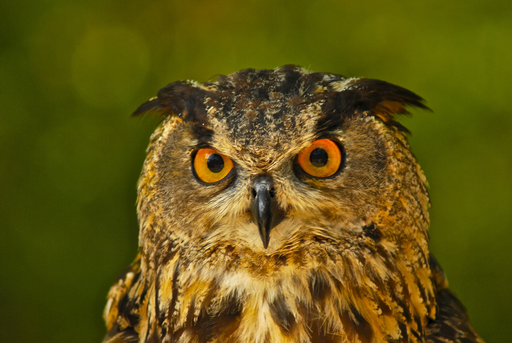

In [81]:
owl = load_image_colour("imgs/owl.png")
show_image(owl, width="50%")

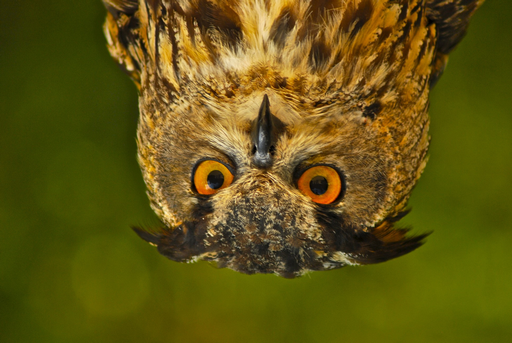

In [82]:
# flip up-down
show_image(owl[::-1, :], width="50%")

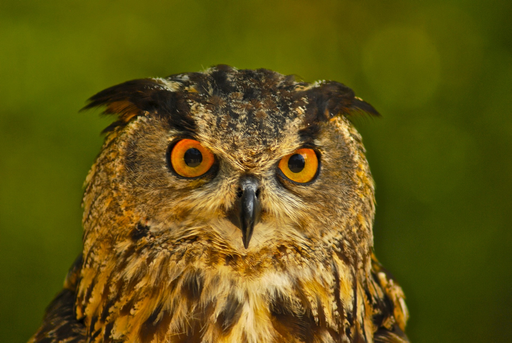

In [83]:
# flip left-right
show_image(owl[:,::-1], width="50%")

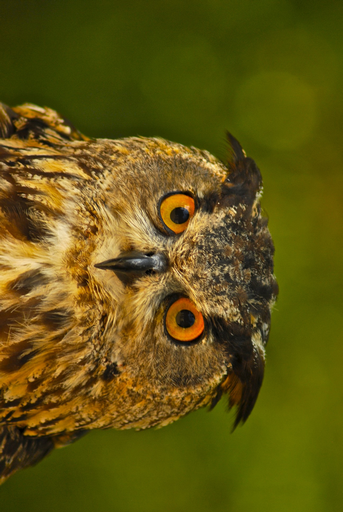

In [84]:
# rotate 90
show_image(owl[::-1, :].swapaxes(0,1), width="50%")

#### Symmetric owls

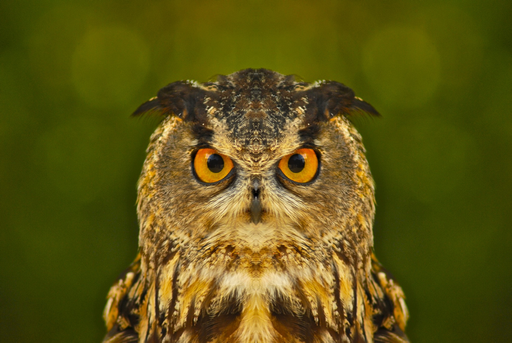

In [85]:
# split the owl into a left and right half
h,w,d = owl.shape

left = owl[:, :w//2, :]  # //2 just means integer division by 2 (i.e. no floating point part)
right = owl[:, w//2:, :]
## we'll see concatenate in a moment
show_image(np.concatenate([left, left[:,::-1]], axis=1), width="50%")

# Cut+tape operations
## Joining and stacking
We can also join arrays together. But unlike simple structures like lists, we have to explicitly state on which **dimension** we are going to join. And we must adhere to the rule that the output array has rectangular shape; we can't end up with a "ragged" array. (arrays are *always* rectangular)

<img src="imgs/join.png" width="240px">

### concatenate and stack
Because arrays can be joined together along different axes, there are two distinct kinds of joining:
* We can use `concatenate` to join along an *existing* dimension;
* or `stack` to stack up arrays along a *new dimension.*

In [86]:
x = np.array([1,2,3,4])
y = np.array([5,6,7,8])
print_matrix("x", x)
print_matrix("y", y)

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [87]:
print_matrix("\\text{stack}(x, y)", np.stack([x,y]))

<IPython.core.display.Latex object>

In [88]:
print_matrix("\\text{concatenate}(x,y)", np.concatenate([x,y]))

<IPython.core.display.Latex object>

If we `concatenate` when we have multiple dimensions, we can specify explicitly
which axis to join on:

In [89]:
# when we have multiple dimensions, we can specify explicitly
# which axis to join on
x = np.zeros((3, 3))
y = np.ones((3, 3))
print_matrix("x", x)
print_matrix("y", y)

print_matrix("\\text{concatenate}_0(x,y)", np.concatenate([x,y], axis=0))
print_matrix("\\text{concatenate}_1(x,y)", np.concatenate([x,y], axis=1))
      


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

### 2D matrix stacking shorthand

As a shorthand, there are three defined stacking operations for specific axes when working with 2D matrices:
* `np.hstack()` stacks horizontally
* `np.vstack()` stacks vertically
* `np.dstack()` stacks "depthwise" (i.e. one matrix on top of another)

All of these operate on 2D matrices

In [90]:
print_matrix('\\text{hstack}',
             np.hstack([x, y]))  # same as np.concatenate([x,y], axis=0)

<IPython.core.display.Latex object>

In [91]:
print_matrix('\\text{vstack}',
             np.vstack([x, y]))  # same as np.concatenate([x,y], axis=1)

<IPython.core.display.Latex object>

In [92]:
show_boxed_tensor_latex(np.dstack([x, y]))  # same as np.stack([x,y])

<IPython.core.display.Latex object>

## Tiling
We often need to be able to **repeat** arrays. This is called **tiling** and `np.tile(a, tiles)` will repeat `a` in the shape given by `tiles`, joining the result together into a single array.

In [93]:
eye = np.array([[1., 0.], [0., -1.]])
print_matrix("e", eye)

<IPython.core.display.Latex object>

In [94]:
print("Repeated 4 times, columns")
print_matrix("e_{1,4}", np.tile(eye, (1,4)))


Repeated 4 times, columns


<IPython.core.display.Latex object>

In [95]:
print("Repeated 4 times, rows")
print_matrix("e_{4,1}", np.tile(eye, (4,1)))

Repeated 4 times, rows


<IPython.core.display.Latex object>

In [96]:
print("Repeated 2x2x2x2 times")

show_boxed_tensor_latex(np.tile(eye, (2,2,2,2)))


Repeated 2x2x2x2 times


<IPython.core.display.Latex object>

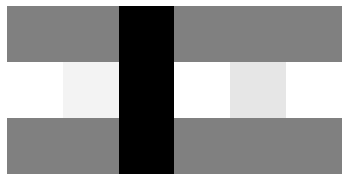

In [97]:
fret = np.array([[0.5, 0.5,0,0.5, 0.5,0.5], 
                 [1,0.95, 0, 1,0.9,1],
                 [0.5, 0.5, 0, 0.5, 0.5,0.5]])
show_image_mpl(fret)

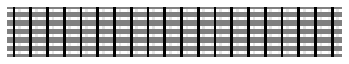

In [98]:
show_image_mpl(np.tile(fret, (6, 20)))
# <-- insert rest of guitar here

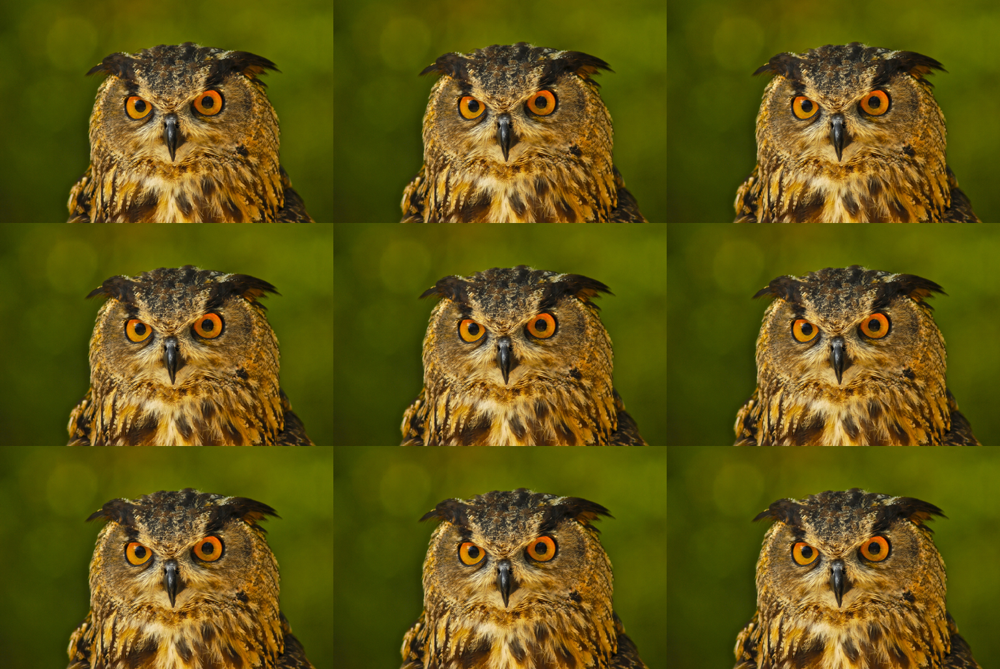

In [99]:
# 3x3 grid of owls
show_image(np.tile(owl, (3,3,1)))

## Stretching sounds
We can use tiling to time stretch sounds:

In [100]:
# choose an even sized segment

guitar = load_sound("sounds/guitar.wav")
play_sound(guitar)

In [107]:
snd = guitar[:48000 * 4]
# split into 4800 segment wide blocks
snd_s = snd.reshape(-1, 2)
snd_s = np.tile(snd_s, (1, 2)).ravel()
snd_s = snd_s.reshape(-1, 4800)
snd_s = snd_s[::2,:].ravel()

# tile each block 4 times, then read out the whole thing
# in one long thread
play_sound(snd_s)

In [102]:
# we can actually fix the clicking easily
import scipy.signal
w = 1200
slow = 3
snd_s = snd.reshape(-1, w)
snd2 = np.concatenate([np.zeros(w // 2, ), snd, np.zeros(w // 2, )])
snd_s2 = snd2.reshape(-1, w)


n = scipy.signal.hann(w)  # some magic
a = np.tile(snd_s * n, (1, slow)).ravel()
b = np.tile(snd_s2 * n, (1, slow)).ravel()
play_sound((a + b[w // 2:-(slow * w - w // 2)]))

# Selection and masking
Comparisons between arrays result in Boolean arrays, as we have seen:

In [108]:
x = np.array([1, 2, 3, 4])
y = np.array([2, 2, 2, 2])
print_matrix("x", x)
print_matrix("y", y)
print_matrix("x>y", (x > y))

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

These Boolean arrays have many useful applications in **selecting** specific data, or alternatively **masking** specific data. Selection and masking are basic operations.

## where, nonzero
We can use a Boolean array to select elements of an array with `np.where(bool, a,b)` which selects `a` where `bool` is True  and `b` where `bool` is False. `bool`, `a` and `b` must be the same shape, or be broadcastable to the right shape.

In [109]:
print(np.where(x > y, 1, 0))

[0 0 1 1]


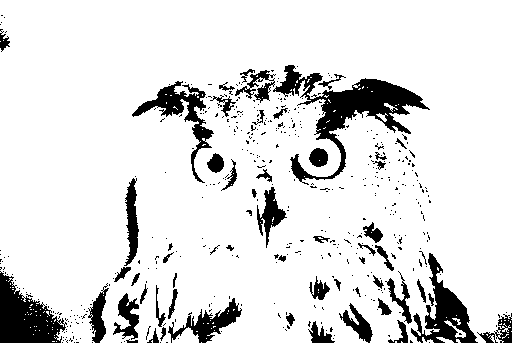

In [110]:
owl_gray = load_image_gray("imgs/owl.png")

# force to either black (0) or to white (1), by thresholding at 0.2
show_image(np.where(owl_gray<0.2, 0, 1), width="50%")

#### nonzero
We can convert a boolean array to an array of **indices** with `nonzero`

In [111]:
x = np.array([10, 7, 2, 9, 0, 5, 2, 1])
print((np.nonzero(x > 3)))

(array([0, 1, 3, 5], dtype=int64),)


In [ ]:
## find *indices* where wheat price was > 50
wheat = np.loadtxt("data/Wheat.csv", delimiter=',')
expensive_rows = np.nonzero(wheat[:,2]>50)

# use the indices to index the rows
wheat[expensive_rows]

---

## Fancy indexing
This brings us to the next operation -- an extension of indexing, which allows us to index arrays with arrays. It is a very powerful operator, because we can select *irregular* parts of an array and perform operations on them.

### Index arrays
For example, an array of **integer** indices can be used as an index directly:

In [112]:
x = np.array([10, 20, 30, 40])
y = np.array([0, 1, 1, 2, 2, 1])
print_matrix("x", x)
print_matrix("y", y)
print_matrix("x[y]", x[y])

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [117]:
x2d = np.array([[10, 20, 30], [40, 50, 60], [70, 80, 90]])
y = np.array([0, 1, 1])
## indexes as row slices
print_matrix('x', x2d)
print_matrix('y', y)
print_matrix('x_{2d}[y]', x2d[y])

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Dimensions are always still separated by commas:

In [118]:
z2d = np.array([0,0,2])
## indexes as row slices
## TRICKY: we index first by y2d (to get the array above), *then* by z2d to select the columns
print((x2d[y, z2d]))

[10 40 60]


In [ ]:
## find indices where wheat price was > 50
expensive_indices = np.nonzero(wheat[:,2]>50)

# print the matching years
print((wheat[:,1][expensive_indices]))

### Boolean indexing
As well as using indices, we can directly index arrays with boolean arrays.


For example, if we have an array 

    x = [1,2,3]
    
and an array
   
    bool = [True, False, True]
   
then `x[bool]` is the array:

    [1,3]
    
Note that this is pulling out *irregular* parts of the array (although the result is always guaranteed to be a rectangular array).    


In [119]:
x = np.array([1, 2, 3, 4, 5, 6, 7, 8])
y = np.array([1, 0, 1, 1, 0, 0, 1, 1])
print_matrix("x", x)
print_matrix("y", y)
print_matrix("x[y==0]", x[y == 0])

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [ ]:
# boolean arrays in broadcasting
x2d = np.array([[10, 20, 30], [40, 50, 60], [70, 80, 90]])

y = np.array([10, 20, 100])
first_column_bigger = x2d[:, 0] <= y

print_matrix("x", x2d)
print_matrix("y", y)

print_matrix("x[x[:,0]\leq y]", x2d[first_column_bigger])
# select the rows where the first column of x is <= correspond element of y

In [ ]:
# the wheat example, selecting years when the cost of wheat was > 50 shillings / quarter bushel
print((wheat[:,1][wheat[:,2]>50])) # note the double indexing

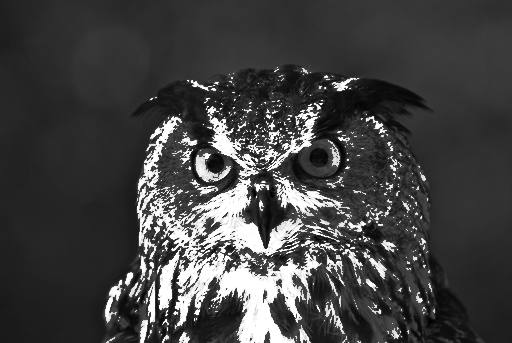

In [120]:
owl_masked = np.array(owl_gray) # copy the owl
# we can use fancy indexing in assignments, exactly as we would in any other operation
owl_masked[owl_masked<0.5] *= 0.6 # make the dark bits darker
owl_masked[owl_masked>0.5] *= 1.6 # and the light bits lighter

show_image(owl_masked, width="50%")

## Selection review

* **Slicing** can chop out rectangular sections of an array, including with regular gaps. `x[2:5, :]` selects rows 3-6 of `x`. `x[:, :, ::-1]` selects all of `x`, but with the last axis reversed (e.g RGB colours -> BGR colours). 

* **Specific indexing** We can index anywhere we could specify a slice range with a list instead. This allows quick tricks to rearrange elements. `x[[0, 2, 1], :]` will return an array with the first, third and second rows of `x`, in that order. 

* **Boolean indexing** or **masking**. if we index an array with a Boolean array instead of a slice range, we will get all of the elements where that array was True. This is particularly useful in assignments. We can, for example, write `x[x > 5] = 0` to set all value of `x` that are greater than 5 to 0. 

---



# Map: arithmetic on arrays

The major advantage of array representations is to be able to do arithmetic on arrays directly. 

Basic arithmetic is computed **elementwise**. This means that a function is applied to each element of an array. There are a few different kind of element wise operations:

* single argument, like `np.tan()` or unary negative `(-x)`
* two argument, like `x+y` or `x-1` or `np.maximum(x,y)`
* and various other cases, like np.where(condition, true_values, false_values)`

All of these work on arrays without any special syntax. We can simply write expressions using array variables.

    x + y + 2  # if x and y are arrays, this just works

In [122]:
x = np.array([1, 2, 3, 4])
y = np.array([0, 1, 2, 3])
print_matrix("x", x)
print_matrix("y", y)

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [123]:
print_matrix("x+y", x+y)
print_matrix("x-y", x-y)
print_matrix("x*y", x*y)
print_matrix("x/y", x/y)
print_matrix("x^y", x**y)

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

c:\local\conda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in true_divide
  after removing the cwd from sys.path.


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [124]:
# examples with scalars and arrays
print_matrix("x+1", x + 1)
print_matrix("2x", x * 2)
print_matrix("1/x", 1 / x)
print_matrix("x^2", x**2)

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

### Applying simple functions
Standard functions, like `cos` or `tan` can be applied to arrays:

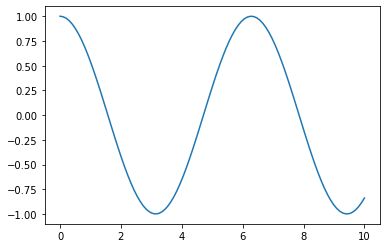

In [126]:
x = np.linspace(0,10,100)
plt.plot(x, np.cos(x))

# An example: changing volume
If a sound is just an array of values, then we can use array operations to apply changes to a whole sound at once.

For example, scaling (multiplying the values) will change the volume.

In [127]:
guitar = load_sound("sounds/guitar.wav")
play_sound(guitar)

In [128]:
play_sound(guitar*0.2)

In [129]:
play_sound(np.tanh(guitar*1200)*0.15) # distortion pedal

In [130]:
play_sound(np.convolve(guitar, np.ones(50)/50)) # bass only

In [131]:
play_sound(np.convolve(guitar, np.random.normal(0,1, 15000) * np.exp(-np.linspace(0, 5, 15000))) * 0.02) # reverb

If we wanted to fade out the sound, we'd need to multiply *each element* by a different value (e.g. fading from 0.0 to 1.0).


In [132]:
fade = np.linspace(1,0, len(guitar))**2
play_sound(guitar*fade)

## Mixing sounds
Mixing sounds simply involves adding them (and possibly reducing the gain)

In [133]:
sax = load_sound("sounds/erhu.wav")
play_sound(sax)

In [134]:
max_len = min(len(guitar), len(sax))
# nb: here I slice so that both are the length of the shortest sound
play_sound(sax[:max_len] + guitar[:max_len])

In [135]:
play_sound(guitar[:max_len]*fade[:max_len]+
           sax[:max_len]*(1-fade[:max_len]))

## Map
This is a special case of a **map**: the application of a function to each element of a sequence.

    
There are certain rules which dictate what operations can be applied together.

* For single argument operations, there is no problem; the operation is applied to each element of the array
* If there are more than two arguments, like in `x + y`, then `x` and `y` must have **compatible shapes**. This means it must be possible to pair each element of `x` with a corresponding element of `y`


### Same shape
In the simplest case, `x` and `y` have the same shape; then the operation is applied to each pair of elements from `x` and `y` in sequence.

### Not the same shape
If `x` and `y` aren't the same shape, it might seem like they cannot be added (or divided, or "maximumed"). However, NumPy provides **broadcasting rules** to allow arrays to be automatically expanded to allow operations between certain shapes of arrays.

### Repeat until they match
The rule is simple; if the arrays don't match in size, but one array can be *tiled* to be the same size as the other, this tiling is done implicitly as the operation occurs. For example, adding a scalar to an array implicitly *tiles* the scalar to the size of the array, then adds the two arrays together (this is done much more efficiently internally than explicitly generating the array).

The easiest broadcasting rule is scalar arithmetic: `x+1` is valid for any array `x`, because NumPy **broadcasts** the 1 to make it the same shape as `x` and then adds them together, so that every element of `x` is paired with a 1.

Broadcasting always works for any scalar and any array, because a scalar can be repeated however many times necessary to make the operation work.

You can imagine that `x+1` is really `x + np.tile(1, x.shape)` which works the same, but is much less efficient:

In [136]:
x = np.zeros((5, 5))
x + 1

array([[1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.]])

In [137]:
# same, but creates large temporary array
x + np.tile(1, x.shape)

array([[1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.]])

## Broadcasting
So far we have seen:
* **elementwise array arithmetic** (both sides of an operator have exactly the same shape) and 
* **scalar arithmetic** (one side of the operator is a scalar, and the other is an array). 

This is part of a general pattern, which lets us very compactly write operations between arrays of different sizes, under some specific restrictions. 

**Broadcasting** is the way in which arithmetic operations are done on arrays when the operands are of different shapes.

1. If the operands have the same number of dimensions, then they **must** have the same shape; operations are done elementwise. `y = x + x`
1. If one operand is an array with fewer dimensions than the other, then if the *last dimensions* of the first array match the shape as the second array, operations are well-defined. If we have a LHS of size (...,j,k,l) and a RHS of (l) or (k,l) or (j,k,l) etc., then everything is OK.

This says for example that:

    shape (2,2) * shape(2,) -> valid
    shape (2,3,4) * shape(3,4) -> valid
    shape (2,3,4) * shape(4,) -> valid
    
    shape (2,3,4) * shape (2,4) -> invalid 
    shape (2,3,4) * shape(2) --> invalid
    shape (2,3,4) * shape(8) --> invalid

#### Broadcasting is just automatic tiling
When broadcasting, the array is *repeated* or tiling as needed to expand to the correct size, then the operation is applied. So adding a (2,3) array and a (3,) array means repeating the (3,) array into 2 identical rows, then adding to the (2,3) array.


----

In [138]:
vec4 = np.array([1, 2, 3, 4])
mat4 = np.zeros((4, 4))  # 4x4 zeros

In [139]:
mat3x4 = np.full((3, 4), 8.0)  # 3x4 filled with 8
vec3 = np.array([1, 2, 3])
vec4x = np.array([1, 1, 1, 1])

In [140]:
print((vec4+1))        # scalar (Rule 2)
print((vec4 + vec4x))  # elementwise (Rule 1)

[2 3 4 5]
[2 3 4 5]


In [141]:
print((mat4 + mat4))   # elementwise (Rule 1)

[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


In [142]:
# note that vec4 is repeated over the rows to make it the same size 
print((mat4 + vec4))   # broadcasting: valid because RHS (vec4) has dimension matching the last dimension of matt4

[[1. 2. 3. 4.]
 [1. 2. 3. 4.]
 [1. 2. 3. 4.]
 [1. 2. 3. 4.]]


In [143]:
# note that the operation operates across *columns*, i.e the last dimension of the array
print((mat3x4 + vec4)) # broadcasting

[[ 9. 10. 11. 12.]
 [ 9. 10. 11. 12.]
 [ 9. 10. 11. 12.]]


In [ ]:
# broadcasting also works on comparisons
mat4x = np.array([[1,2,3,4],
                  [4,5,6,7],
                  [8,9,10,11],
                  [12,13,14,15]])
print((mat4x>vec4))
# note this has compared [1,2,3,4] to each row of mat4x

### Invalid broadcasting examples

In [144]:
print((mat3x4 + vec3)) # invalid: last dimensions don't match!

ValueError: operands could not be broadcast together with shapes (3,4) (3,) 

In [ ]:
print((mat4+vec3)) # invalid: last dimensions don't match

In [ ]:
print((mat4+mat3x4)) # invalid: arrays have same rank but different shape

## Transposing in broadcasts
Transpose solves one of the problems you might have seen with broadcasting. Imagine we want to add a vector to every row of a matrix. This is easy:

In [ ]:
x = np.zeros((4,3)) # 4 rows, 3 columns
y = np.array([1,1,9]) # 3 element vector, applies to each row
print_matrix("x",x )
print_matrix("y",y)
# this will repeat the 3 element vector into 4 rows, then add
print_matrix("x+y",x+y)

But how would we add a vector to each *column*? This would need a 4 element vector, and this cannot be added directly as it violates the broadcasting rules

In [ ]:
z = np.array([1,2,3,4])
print_matrix("x+z", x+z) # this can't work; a 4x3 and a 4 don't have matching last dimensions

But the **transpose** of `x` is a 3x4 matrix, to which `z` can be added. The result is transposed, so we transpose it back:

In [ ]:
print_matrix("(x^T+z^T)^T", (x.T + z).T)

# Reduction

**Reduction** (sometimes called **fold**) is the process of applying an operator or function with two arguments repeatedly to
some sequence. 

For example, if we reduce [1,2,3,4] with `+`, the result is `1+2+3+4 = 10`. If we reduce `[1,2,3,4]` with `*`, the result is `1*2*3*4 = 24`. 

**Reduction: stick an operator in between elements**

    1 2 3 4
    5 6 7 8
   
Reduce on columns with "+":

    1 + 2 + 3 + 4  =  10
    5 + 6 + 7 + 8  =  26
    
Reduce on rows with "+":

    1 2 3 4
    + + + +
    5 6 7 8
    
    = 
    6 8 10 12
    
Reduce on rows then columns:

    1 + 2 + 3 + 4
    +   +   +   +
    5 + 6 + 7 + 8
    
    = 
    6 + 8 + 10 + 12  = 36


Many operations can be expressed as reductions. These are **aggregate** operations.


`np.any` and `np.all` test if an array of Boolean values is all True or not all False (i.e. if any element is True). These are one kind of **aggregate function** -- a function that processes an array and returns a single value which "summarises" the array in some way.

* `np.any` is the reduction with logical OR
* `np.all` is the reduction with logical AND
* `np.min` is the reduction with min(a,b)
* `np.max` is the reduction with max(a,b)
* `np.sum` is the reduction with +
* `np.prod` is the reduction with *

In [145]:
print("any", np.any([True, False, False]))  # true = True or False or False
print("all", np.all([True, False, False]))  # false = True and False and False

any True
all False


In [146]:
x = np.array([1, 2, 3, 4, 5, 6])  # 1 + 2 + 3 + 4 + 5 + 6
print(np.sum(x))

21


In [147]:
print(np.prod(x))  # 1 * 2 * 3 * 4 * 5 * 6 = 6!

720


In [148]:
print(np.max(x))  # max(max(max(max(max(1,2), 3), 4), 5), 6)

6


Some functions are built on top of reductions:
* `np.mean` is the sum divided by the number of elements reduced
* `np.std` computes the standard deviation using the mean, then some elementwise arithmetic

In [149]:
print(np.mean(x))
print(np.sum(x) / len(x))  # equivalent

3.5
3.5


By default, aggregate functions operate over the whole array, regardless of how many dimensions it has. This means reducing over the last axis, then reducing over the second last axis, and so on, until a single scalar remains. For example, `np.max(x)`, if `x` is a 2D array, will compute the reduction across columns and get the max for each row, then reduce over rows to get the max over the whole array.

We can specify the specific axes to reduce on using the `axes=` argument to any function that reduces.

In [4]:
x = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])
print_matrix("x", x)
print("max(x)=", np.max(x))  # reduce on all axes
print_matrix("max_{0}(x)", np.max(x, axis=0))  # reduce on rows
print_matrix("max_{1}(x)", np.max(x, axis=1))  # reduce on columns
print_matrix("max_{0,1}(x)",
             np.max(x, axis=(0, 1)))  # same as all axes in this case

<IPython.core.display.Latex object>

max(x)= 9


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [151]:
print_matrix("\\text{mean}_0(x)", np.mean(x, axis=0))  # mean on rows
print_matrix("\\text{mean}_1(x)", np.mean(x, axis=1))  # mean on columns

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

# Accumulation
The sum of an array is a single scalar value. The **cumulative sum** or **running sum** of an array is an array of the same size, which stores the result of summing up every element until that point. 

This is almost the same as reduction, but we keep intermediate values during the computation, instead of collapsing to just the final result. The general process is called **accumulation** and it can be used with different operators.

For example, the accumulation of `[1,2,3,4]` with `+` is `[1, 1+2, 1+2+3, 1+2+3+4] = [1,3,6,10]`.

* `np.cumsum` is the accumulation of `+`
* `np.cumprod` is the accumulation of `*`
* `np.diff` is the accumulation of `-` (but note that it has one less output than input)

Accumulations operate on a single axis at a time, and you should specify this if you are using them on an array with more than one dimension (otherwise you will get the accumulation of flattened array). 



In [5]:
print_matrix("x", x)
print_matrix("\\text{cumsum}_0(x)", 
             np.cumsum(x, axis=0)) # sum across rows
print_matrix("\\text{cumprod}_1(x)", 
             np.cumprod(x, axis=1)) # product across columns
print_matrix("\\text{diff}_0(x)", 
             np.diff(x, axis=0)) # difference across rows
print_matrix("\\text{diff}_1(x)", np.diff(x, axis=1)) # difference across columns

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

* `np.gradient` is like `np.diff` but uses central differences to get same length output, and it computes the gradient over *every* axis and returns them all in a list. It is a very useful function in image processing.

In [6]:
print_matrix("\\nabla x_0", np.gradient(x)[0])
print_matrix("\\nabla x_1", np.gradient(x)[1])

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [7]:
# use gradient to get "edges" of an image
dx, dy = np.gradient(owl[:,:,0])
show_image(np.dstack([dx, dy, dx*0])+0.5, width="50%")

NameError: name 'owl' is not defined

In [ ]:
show_image(500 * (dx**2 + dy**2)**2, width="50%")

## Finding

There are functions which find **indices** that satisfy criteria. For example, the largest value along some axis.

* `np.argmax()` finds the index of the largest element
* `np.argmin()` finds the index of the smallest element
* `np.argsort()` finds the indices that would sort the array back into order
* `np.nonzero()` finds indices that are non-zero (or True, for Boolean arrays)

Finding indices is of great importance, because it allows us to cross-reference across axes or arrays. For example, we can find the row where some value is maximised (most wheat production) and then find the attribute which corresponds to it (the year when most wheat was produced).



In [ ]:
x = np.array([5,9,0,13,-8,7,2,8,0,-8])
print_matrix("x", x)
# note: argmin/max will tie break on the first occurence
print_matrix("argmin(x)", np.argmin(x)) 
print_matrix("argmax(x)", np.argmax(x))

In [ ]:
print("nonzero(x)=", np.nonzero(x))

## argmin is almost the same as this
## but this can return *multiple* minimums, instead of the first
print(np.nonzero(x==np.min(x)))

## Argsorting
**argsort** finds the indices that would put an array in order. It is an *extremely* useful operation.

In [ ]:
# get the indices that would put x into order
print_matrix('x', x)
print_matrix('\\text{argsort}(x)', np.argsort(x))

In [ ]:
# hey presto! sorted!
print_matrix('x[\\text{argsort}(x)]', x[np.argsort(x)])

---

## Key Resources

* [A visual guide to NumPy](https://jalammar.github.io/visual-numpy/) This is an excellent intro that covers most of the concepts here.
* [NumPy tutorial](http://scipy.github.io/old-wiki/pages/Tentative_NumPy_Tutorial)

See the **Resources** page on Moodle for a full list of resources, including some more advanced material for those who are interested.


-----

# NumPy reference

This is a quick reference guide. **We won't cover this in the lecture.**


### NumPy reference
In DF(H) We will use the following NumPy functions/functionality. You should know
what these functions do and be ready to use them by the end of the first two weeks.

These are [all covered in the NumPy API reference](https://docs.scipy.org/doc/numpy-1.13.0/reference/index.html)

* multidimensional slicing syntax `x[1,2:5]`
* broadcasting arithmetic `x+4`
* slice assignment `x[0:5] = 1`
* boolean indexing `x[[True, False, False]]`
* [fancy indexing](https://docs.scipy.org/doc/numpy-1.13.0/reference/arrays.indexing.html) `x[y] += 1` 

### Generation
* `np.loadtxt` / `np.savetxt`
* `np.zeros` / `np.ones` / `np.full` / `np.empty`
* `np.zeros_like` / `np.zeros_like` / `np.full_like` / `np.empty_like`
* `np.arange`
* `np.linspace`
* `np.array`
* `np.meshgrid`

### Logical
* `np.logical_and` / `np.logical_or` / `np.logical_not`

### Reductions
* `np.any` / `np.all`
* `np.prod`
* `np.min` / `np.max`
* `np.sum` / `np.mean` / `np.std`

### Accumulations
* `np.cumprod` / `np.cumsum`
* `np.diff` / `np.gradient`

### Random
* `np.random.uniform` / `np.random.normal` / `np.random.randint`
*  `np.random.choice` / `np.random.permuation`

### Reshaping
* `np.tile`
* `np.transpose`  / `x.T`
* `np.stack` / `np.concatenate`
* `np.squeeze`
* `np.reshape`
* `np.einsum`
* `np.ravel`
* `np.swapaxes` / `np.rollaxes`


### Floating point handling
* `np.isinf` / `np.isnan` / `np.isfinite`
* `np.nan` / `np.inf`
* `np.allclose`
* `np.frexp`

### Index finding and sorting
* `np.argmin` / `np.argmax` 
* `np.argsort` / `np.sort`
* `np.nonzero`
* `np.where`

### Matrix operations
* `np.dot` / `np.inner` Inner of vectors / matrices / tensors
* `np.outer` Outer product

### Standard functions (ufuncs)
* `np.minimum`, `np.maximum` (elementwise min/max)
* `np.add`, `np.subtract`, `np.multiply` (function forms of + and -)
* `np.log`, `np.exp`
* `np.sin`, `np.cos`, `np.tan`, `np.arcsin`, `np.arccos`, `np.tanh`, etc.

